# Project - Logical Arcitecture Elements Study 

This is a study that will use properties in the a Capella model to perform a study on the number of solar panels required to satisfy various a few usage scenarios.

Access the System Model that is in GitHUB folder with a python module "caplellambse" that can read and modify the SMW/Capella model content.

In [1]:
import capellambse
import ipywidgets as widgets
from IPython.core.display import HTML
import numpy as np
import pandas as pd 
from IPython.display import Markdown

resources = {
    "Trail_Power_for_Campgrounds": "Trail_Power_for_Campgrounds/Trail Power for Campgrounds",
}
path_to_model = "../Trail Power.aird"
model = capellambse.MelodyModel(path_to_model, resources=resources)

Display a diagram from the capella module with parameters being accessed. Note that this diagram is not being pulled dynamically, due to the desire to see the parameters on the diagram. It is pulling a snapshot of a .jpg diagram.

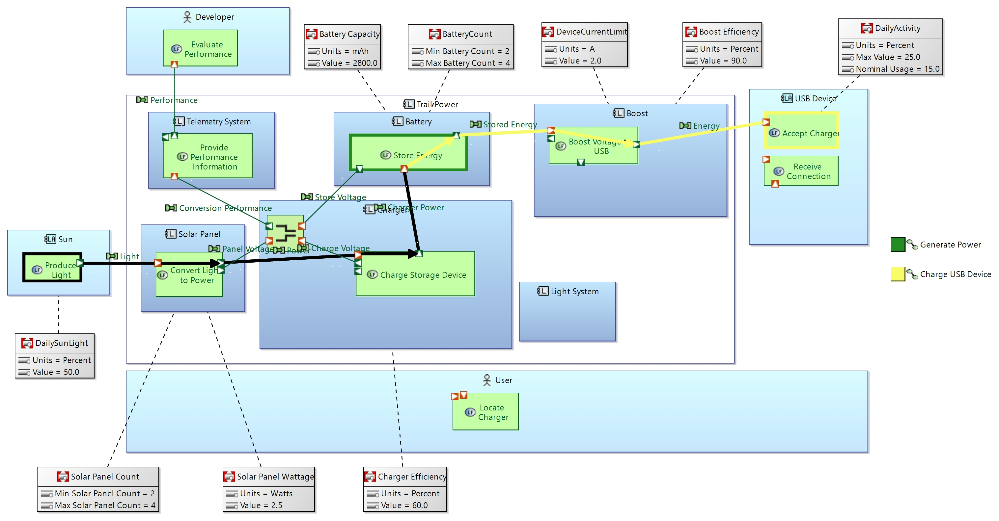

In [2]:
from IPython import display as diag_display
diag_display.Image("../Images/[LAB] Trail Power (Charge) Properties.jpg")


## Display of all the parameters and respective components/functions in the logical architecture
The following is a report of all the parameters avialable to be used from the logical architecture. 

In [3]:
la_model = model.la 

df = pd.DataFrame({
    'Logical Function': [],
    'Property Value Group Name': [],
    'Propery Name': [],
    'Property Value': [],
    })

for function in la_model.all_functions:
    for pvg in  function.applied_property_value_groups :
        for pv in  pvg.property_values:
            #print("LogicalFunction=",'"' +function.name+ '"',"property_value_groups=",'"' +pvg.name+ '"','"Property Name"=','"' +pv.name+ '"','"Value"=',pv.value )
            df.loc[len(df)] = [function.name,pvg.name,\
                                pv.name, pv.value]
display(df)
df = pd.DataFrame({
    'Logical Component': [],
    'Property Value Group Name': [],
    'Propery Name': [],
    'Property Value': [],
    })
for component in la_model.all_components:
    for pvg in  component.applied_property_value_groups :
        for pv in  pvg.property_values:
            #print("LogicalComponents=",'"' +component.name+ '"',"property_value_groups=",'"' +pvg.name+ '"','Property Name=','"' + pv.name + '"','Value=',pv.value  )
            df.loc[len(df)] = [component.name,pvg.name,\
                                pv.name, pv.value]
display(df)

,Logical Function,Property Value Group Name,Propery Name,Property Value
0,Accept Charger,DailyActivity,Units,Percent
1,Accept Charger,DailyActivity,Max Value,25.0
2,Accept Charger,DailyActivity,Nominal Usage,15.0


,Logical Component,Property Value Group Name,Propery Name,Property Value
0,Boost,Boost Efficiency,Units,Percent
1,Boost,Boost Efficiency,Value,90.0
2,Boost,DeviceCurrentLimit,Units,A
3,Boost,DeviceCurrentLimit,Value,2.0
4,Battery,Battery Capacity,Units,mAh
5,Battery,Battery Capacity,Value,2800.0
6,Battery,BatteryCount,Min Battery Count,2
7,Battery,BatteryCount,Max Battery Count,4
8,Solar Panel,Solar Panel Wattage,Units,Watts
9,Solar Panel,Solar Panel Wattage,Value,2.5


The following code can be used in the study to retrive the value from the model to use in the study.

your_variable = model.search("LogicalFunction").by_name("Name of Function").property_value_groups["Name of property Value Group"]["Name of Property"])

your_variable = model.search("LogicalComponent").by_name("Name of Component").property_value_groups["Name of property Value Group"]["Name of Property"])

You can see an example below.

In [4]:
print( "Battery Size" , model.search("LogicalComponent").by_name("Battery").property_value_groups["Battery Capacity"]["Value"] ,\
"Units:" ,model.search("LogicalComponent").by_name("Battery").property_value_groups["Battery Capacity"]["Units"])

Battery Size 2800.0 Units: mAh


# Analysis by Functional Chain
Typically analysis could be done by functional chain. You may even want leverage content of the model to define variable in your study.

In [11]:


# Currently it does not handle Chains that Reference Chains. 
# Looking at options on how to handle it. 
for fc in model.la.all_functional_chains:
    print(fc)
    print()
    #print("Functional Chain:", fc.name)
    display(Markdown(f"# Functional Chain: {fc.name}"))


    df = pd.DataFrame({
    'Function Owner': [],
    'Function': [],
    'Function Exchange': [],
    'Function Exchange Items': [],
    'Function Exchange Item Elements': [],
    })
    def Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                               Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE) :
        df.loc[len(df)] = [Current_Function_Owner ,Current_Function,\
                                Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE]
        
    for function in fc.involved_functions:
        #This will initialize all the table elements
        Current_Function_Owner = ''
        Current_Function =''
        Current_Function_Exchange = ''
        Current_Function_Exchange_EI = ''
        Current_Function_Exchange_EIE = ''
        
        #print(function.owner)
        if function.owner != None :
         
            Current_Function_Owner=function.owner.name
            #print("- Entity:",Current_Function_Owner)
            #print("-Function:",function.name)
            Current_Function = function.name
            #print("-Function:",Current_Function)
           
            
            #print("---Exch:",exchange.name)
            for output in function.outputs:
               # print(output)
                is_FOs= True
                Current_Function_OPort = output.name
                #Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                #                 Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE)
                for exchange in output.exchanges:         
                    for involved_exchange in fc.involved_links:
                         if exchange == involved_exchange:
                             Current_Function_Exchange = exchange.name
                             #print("--Output:",output.name)
                             #print("---Exch:",Current_Function_Exchange)
                             
                             for exchange_item in exchange.exchange_items: 
                                 Current_Function_Exchange_EI = exchange_item.name
                                 #print("--Output:",output.name)
                                 #print(exchange_item)
                                 #print("---Exch Item:",Current_Function_Exchange_EI)

                                 for element in exchange_item.elements: 
                                     Current_Function_Exchange_EIE = element.name
                                     #print(element)
                                     #print("---Exch Item Elements:",Current_Function_Exchange_EIE)
                                     Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                                        Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE)
                                 if  exchange_item.elements ==  []:
                                     Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                                    Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE) 
                             if exchange.exchange_items == [] :
                                Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                                Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE) 
          
        else: 
            Current_Function_Owner="None"
            print("-Entity","None")
            Current_Function = function.name
            print("-Function",Current_Function )

            for output in function.outputs:  
                Current_Function_OPort = output.name
                Current_Function_OPort = output.name
                #Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                #    Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE)
                for exchange in output.exchanges:
                   for involved_exchange in fc.involved_links:
                         if exchange == involved_exchange:
                             
                             
                             Current_Function_Exchange = exchange.name
                             #print("--Output:",output.name)
                             #print("---Exch:",Current_Function_Exchange)
                             if exchange.exchange_items == [] :
                                 Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                                 Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE)   
                             for exchange_item in exchange.exchange_items: 
                                 Current_Function_Exchange_EI = exchange_item.name
                                 #print("--Output:",output.name)
                                 #print(exchange_item)
                                 #print("---Exch Item:",Current_Function_Exchange_EI)
                                 
                                 
                                 for element in exchange_item.elements: 
                                     Current_Function_Exchange_EIE = element.name
                                     #print(element)
                                     #print("---Exch Item Elements:",Current_Function_Exchange_EIE)
                                     Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                                       Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE)
                                 if exchange_item.elements == []:
                                     Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                                    Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE) 
                             if exchange.exchange_items == [] :
                                 Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                                 Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE)    
                               
            if  function.outputs == []:
                Append_Row_to_Dataframe(df,  Current_Function_Owner ,Current_Function,\
                     Current_Function_Exchange , Current_Function_Exchange_EI, Current_Function_Exchange_EIE)                                 

    

    display(df)
        


<FunctionalChain 'Provide Status' (11515d91-a9f3-4353-bc81-2a58cc115e0e)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = [0] <Diagram '[LFCD] Provide Status'>
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Receive Status' (3d642918-91aa-42f9-a994-a5d631d067e2)>
            [1] <LogicalFunction 'Send Status' (d89865d4-8534-493d-9387-15b287542c91)>
            [2] <LogicalFunction 'Gather Performance Information' (84a124da-fb60-4830-bb0a-5576f121aa6d)>
            [3] <LogicalFunction 'Provide Performance Information' (6a121d11-a7ee-4a0c-8ef8-f3ef2f6c6fc5)>
            [4] <FunctionalExchange 'Status' (a832e5f5-d3b0-43ea-a37c-1e8e3ad4de20)>
            [5] <FunctionalExchange 'Status ' (bb205cdc-eef1-4552-bda5-0bc7ec310afe)>
            [6] <FunctionalExchange 'Performance Information' (a3c7a481-af3f-4932-bed1-a0297a24888b)>
.involved_chains = []
.involved_functions = [0] <LogicalFu

# Functional Chain: Provide Status

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,Charger Tracking System,Send Status,Status,,
1,Charger Tracking System,Gather Performance Information,Status,,
2,Telemetry System,Provide Performance Information,Performance Information,,


<FunctionalChain 'Generate Power' (0f2b998d-9cb0-4fc3-9167-9a1cc481f725)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = [0] <Diagram '[LFCD] Generate Power'>
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Produce Light' (c75cb181-266a-4bd5-b4a1-c68934ef45ca)>
            [1] <LogicalFunction 'Convert Light to Power' (a1d82e0d-5dd9-4a2b-9f80-8cf7dc135940)>
            [2] <LogicalFunction 'Charge Storage Device' (35b0d159-0416-4bb0-954c-450d75c98545)>
            [3] <LogicalFunction 'Store Energy' (f79ae36f-4477-4560-87d6-85213a597406)>
            [4] <FunctionalExchange 'Light' (6f06fc19-fb68-489d-9653-f4ad3a41fa3d)>
            [5] <FunctionalExchange 'Power' (d9af9761-a3d1-468d-947e-74122dec9583)>
            [6] <FunctionalExchange 'Charger Power' (85ed3524-9676-4900-a945-83d65ba89293)>
.involved_chains = []
.involved_functions = [0] <LogicalFunction 'Produce Light' (c75cb18

# Functional Chain: Generate Power

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,Sun,Produce Light,Light,Light,Light
1,Solar Panel,Convert Light to Power,Power,Panel Power,PanelPanelPower
2,Charger,Charge Storage Device,Charger Power,Charger Power,PowerGenerator


<FunctionalChain 'Connect USB Device' (39b1152a-994b-4f5c-abcc-52671c85b3a2)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = [0] <Diagram '[LFCD] Connect USB Device'>
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Comprend State' (1a931f20-8027-4c53-a0d3-7cb8e124dd38)>
            [1] <LogicalFunction 'Provide State' (fdf4260f-ef9a-4954-89d4-fb5f252891d8)>
            [2] <LogicalFunction 'Connect Device' (0cddaa22-35e3-42d9-970c-785ac701d1d5)>
            [3] <LogicalFunction 'Receive Connection' (a7f991dd-1753-4f1a-bfba-1d2c762d403f)>
            [4] <LogicalFunction 'Receive Connection ' (68d05ebe-eb67-4cde-a50e-376ad07efb86)>
            [5] <LogicalFunction 'Boost Voltage to USB' (e1dd9f8d-ba9f-4119-9b91-e48544cd7c68)>
            [6] <FunctionalExchange 'Charger State' (209f0ae2-3143-4071-b072-623416f1e74a)>
            [7] <FunctionalExchange 'State' (b52ac53d-9477-4a26-9e7

# Functional Chain: Connect USB Device

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,User,Comprend State,State,,
1,Charger,Provide State,Charger State,,
2,User,Connect Device,Device Connection,,
3,User,Connect Device,Charger Connection,,
4,Boost,Boost Voltage to USB,State,,


<FunctionalChain 'Charge USB Device' (40cb3906-26f6-4ecd-8179-a8f138e2c368)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = [0] <Diagram '[LFCD] Charge USB Device'>
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Accept Charger' (a5d26c25-aa0e-476d-85e2-729df808771d)>
            [1] <LogicalFunction 'Boost Voltage to USB' (e1dd9f8d-ba9f-4119-9b91-e48544cd7c68)>
            [2] <FunctionalExchange 'Stored Energy' (c823bdcf-4739-4408-8856-4a9249b07fee)>
            [3] <FunctionalExchange 'Energy' (697f84ea-1b29-4b3d-9b48-4e496421f9e9)>
.involved_chains = [0] <FunctionalChain 'Generate Power' (0f2b998d-9cb0-4fc3-9167-9a1cc481f725)>
.involved_functions = [0] <LogicalFunction 'Accept Charger' (a5d26c25-aa0e-476d-85e2-729df808771d)>
                      [1] <LogicalFunction 'Boost Voltage to USB' (e1dd9f8d-ba9f-4119-9b91-e48544cd7c68)>
.involved_links = [0] <FunctionalExchange 'Stored

# Functional Chain: Charge USB Device

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,Boost,Boost Voltage to USB,Energy,USB Power,USB Signal


<FunctionalChain 'Monitor opertion remotely' (6243dc67-0f5e-4af2-9a59-c93f1e662797)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = [0] <Diagram '[LFCD] Monitor opertion remotely'>
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Evaluate Performance' (8e08e4fd-c18b-4e67-93d0-a4acecf5b5d4)>
            [1] <LogicalFunction 'Provide Performance Information' (6a121d11-a7ee-4a0c-8ef8-f3ef2f6c6fc5)>
            [2] <LogicalFunction 'Voltage Gather' (767385c6-be7d-45e7-8496-276296d46cf3)>
            [3] <LogicalFunction 'Charge Storage Device' (35b0d159-0416-4bb0-954c-450d75c98545)>
            [4] <LogicalFunction 'Convert Light to Power' (a1d82e0d-5dd9-4a2b-9f80-8cf7dc135940)>
            [5] <LogicalFunction 'Store Energy' (f79ae36f-4477-4560-87d6-85213a597406)>
            [6] <FunctionalExchange 'Performance' (4ac53756-894b-4e95-8905-2c74686f86b9)>
            [7] <FunctionalExchan

# Functional Chain: Monitor opertion remotely

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,Telemetry System,Provide Performance Information,Performance,,
1,Charger,Voltage Gather,Conversion Performance,,
2,Charger,Charge Storage Device,Charge Voltage,,
3,Solar Panel,Convert Light to Power,Panel Voltage,,
4,Battery,Store Energy,Store Voltage,,


<FunctionalChain 'Disconnect Device' (8a54333b-35b8-45ff-ac3e-6408cbd6cf24)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = []
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Disconnect' (b2627eb4-9188-4fbb-bf24-df353dffc8ad)>
            [1] <LogicalFunction 'Disconnect Device' (2e375118-e81e-4c34-afe8-2139f489659a)>
            [2] <LogicalFunction 'Disconnect' (b72220ff-c20e-497f-ae20-3a33898f9468)>
            [3] <FunctionalExchange 'Charger Disconnect' (2bfddda8-0ec2-40ee-b3aa-558305ac735d)>
            [4] <FunctionalExchange 'Device Disconnect' (e2cf0a2e-fa66-4de4-95ec-491e1fc41c19)>
.involved_chains = []
.involved_functions = [0] <LogicalFunction 'Disconnect' (b2627eb4-9188-4fbb-bf24-df353dffc8ad)>
                      [1] <LogicalFunction 'Disconnect Device' (2e375118-e81e-4c34-afe8-2139f489659a)>
                      [2] <LogicalFunction 'Disconnect' (b72220ff-c20e-497

# Functional Chain: Disconnect Device

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,User,Disconnect Device,Charger Disconnect,Disconnect,
1,User,Disconnect Device,Device Disconnect,Disconnect,


<FunctionalChain 'Provide Location' (02fbc6ea-6162-4fb4-917c-d27d8be5a271)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = [0] <Diagram '[LFCD] Provide Location'>
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Receive Location' (e0fbc888-84c8-4f80-93f5-3a92b497282f)>
            [1] <LogicalFunction 'Gather Location from Charges' (8692869d-728d-47fc-b3e0-227301e0b22b)>
            [2] <LogicalFunction 'Provide location' (e68041c4-0e24-4f9d-bed1-c91d15aa5b83)>
            [3] <LogicalFunction 'Compute Location ' (03fe88f5-ca99-4973-ba6b-646ef3b59926)>
            [4] <LogicalFunction 'Provide Location' (166bd1a9-9202-4741-8276-252599c59616)>
            [5] <FunctionalExchange 'Location' (89e2f712-a2b9-4426-8a27-2aa41671301f)>
            [6] <FunctionalExchange 'Location from Chargers' (3afff69d-2123-4cc5-af86-fc37780dd8fa)>
            [7] <FunctionalExchange 'Location Data' (e7d

# Functional Chain: Provide Location

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,Charger Tracking System,Gather Location from Charges,Location,,
1,Telemetry System,Provide location,Location from Chargers,,
2,Telemetry System,Compute Location,Location Data,,
3,GPS,Provide Location,Sattelit Location,,


<FunctionalChain 'Provide 24 hour visibility' (5006bd33-0c85-4bce-a30c-a11d9bc1de98)>
.applied_property_value_groups = []
.applied_property_values = []
.constraints = []
.control_nodes = []
.description = Markup('')
.diagrams = [0] <Diagram '[LFCD] Provide 24 hour visibility'>
.filtering_criteria = []
.involved = [0] <LogicalFunction 'Locate Charger' (2d6cbb1d-3362-4c25-a9a9-eddd49f4a07e)>
            [1] <LogicalFunction 'Boost Voltage to USB' (e1dd9f8d-ba9f-4119-9b91-e48544cd7c68)>
            [2] <LogicalFunction 'Supply power when no light' (e088dfff-69b3-4d9b-bf72-26fc36ccab4b)>
            [3] <LogicalFunction 'Power Lights' (e5d60743-4dab-4b20-ac92-97c0f576a403)>
            [4] <LogicalFunction 'Charge Storage Device' (35b0d159-0416-4bb0-954c-450d75c98545)>
            [5] <FunctionalExchange 'Charger Light' (cfb2dd3c-28f0-4c01-bdcc-5d729c41174f)>
            [6] <FunctionalExchange 'Illuminate' (ccc37768-8f26-428b-b0df-d6242d794a33)>
            [7] <FunctionalExchange 'Power'

# Functional Chain: Provide 24 hour visibility

,Function Owner,Function,Function Exchange,Function Exchange Items,Function Exchange Item Elements
0,Boost,Boost Voltage to USB,Illuminate,,
1,Charger,Supply power when no light,Power,,
2,Light System,Power Lights,Charger Light,,
3,Charger,Charge Storage Device,Light Power,,


In [6]:
from sympy import symbols, Piecewise, sin, pi, Heaviside, integrate, And, simplify
import numpy as np

import sympy as sp
import pandas as pd 
import plotly.express as px

from scipy.integrate import simpson
from scipy.stats import kendalltau

In [7]:
t = symbols('t')
period = symbols('period')


In [8]:


# Define the pulse function
def pulse(t, start, width):
    return Piecewise(
        (1, And(t >= start, t < start + width)),
        (0, True)
    )

# Define a pulse train that operates over a specified time length
def pulse_train(t, pulse_width, period, total_time):
    # Calculate the number of pulses that fit within the total time
    num_pulses = int(total_time // period)
    
    # Generate the pulse train expression
    return sum(pulse(t, start=i*period, width=pulse_width) for i in range(num_pulses))


def power_generator(t, pulse_width, period, total_time,  SP_Power, charger_eff ):
    return (charger_eff/100) *SP_Power * pulse_train(t, pulse_width, period, total_time)
    

def battery_load(t,  pulse_width, period, total_time, USB_Current,Boost_Efficiency):
    return USB_Current * 5.0  * ((1 - Boost_Efficiency/100)+1) * pulse_train(t, pulse_width, period, total_time)
    


In [9]:
sun_period_value = model.search("LogicalComponent").by_name("Sun").property_value_groups["DailySunLight"]["Value"] # Example period of 12 hours for .50
load_period_value = model.search("LogicalFunction").by_name("Accept Charger").property_value_groups["DailyActivity"]["Max Value"]  # Example period of 12 hours for .50
panel_power = model.search("LogicalComponent").by_name("Solar Panel").property_value_groups["Solar Panel Wattage"]["Value"] 
solar_panel_count_min = model.search("LogicalComponent").by_name("Solar Panel").property_value_groups["Solar Panel Count"]["Min Solar Panel Count"]
solar_panel_count_max = model.search("LogicalComponent").by_name("Solar Panel").property_value_groups["Solar Panel Count"]["Max Solar Panel Count"]
boost_efficiency = model.search("LogicalComponent").by_name("Boost").property_value_groups["Boost Efficiency"]["Value"]
boost_current_limit = model.search("LogicalComponent").by_name("Boost").property_value_groups["DeviceCurrentLimit"]["Value"]
charger_eff =model.search("LogicalComponent").by_name("Charger").property_value_groups["Charger Efficiency"]["Value"]
battery_capacity =model.search("LogicalComponent").by_name("Battery").property_value_groups["Battery Capacity"]["Value"]/1000 
battery_count_min = model.search("LogicalComponent").by_name("Battery").property_value_groups["BatteryCount"]["Min Battery Count"]
battery_count_max = model.search("LogicalComponent").by_name("Battery").property_value_groups["BatteryCount"]["Max Battery Count"]

display(Markdown(f"# Formulas for Power Generator, BatteryLoad and Battery Charge and constant values for Study from System Model."))

display(Markdown(f" $$SunPeriod= {sun_period_value} $$"))
display(Markdown(f" $$LoadPeriod= {load_period_value} $$"))
display(Markdown(f" $$BoostEfficiency = {boost_efficiency } $$"))
display(Markdown(f" $$USBCurrent = {boost_current_limit } $$"))
display(Markdown(f" $$PowerGenerator(t) = PulseTrain(t,SunPeriod* 24/100,24,24*7)*SolarPanelPower * ChargerEfficiency/100 $$"))
display(Markdown(f" $$BatteryLoad(t) = PulseTrain(t,LoadPeriod * 24/100,24 , 24*7) * USBCurrent * ((1 - BoostEfficiency/100)+1)   $$"))
display(Markdown(f" $$TotalPower(t) = PowerGenerator(t) - BatteryLoad(t)  $$"))
display(Markdown(f" $$BatteryCharge  = \int_{0}^{t} TotalPower(t)\, dt$$"))

# Formulas for Power Generator, BatteryLoad and Battery Charge and constant values for Study from System Model.

 $$SunPeriod= 50.0 $$

 $$LoadPeriod= 25.0 $$

 $$BoostEfficiency = 90.0 $$

 $$USBCurrent = 2.0 $$

 $$PowerGenerator(t) = PulseTrain(t,SunPeriod* 24/100,24,24*7)*SolarPanelPower * ChargerEfficiency/100 $$

 $$BatteryLoad(t) = PulseTrain(t,LoadPeriod * 24/100,24 , 24*7) * USBCurrent * ((1 - BoostEfficiency/100)+1)   $$

 $$TotalPower(t) = PowerGenerator(t) - BatteryLoad(t)  $$

 $$BatteryCharge  = \int_0^t TotalPower(t)\, dt$$

The following study will look at the various configuations of battery count and panel count and generate graphs of Power Produced from the solar pannels, the Power Desired vs Delivered over time, Power Produced and Consumed over time, and the the Battery Charge over time. 

The best system will show Power Desired vs Delivered with the best alignment, meaning that the system is meeting the needs of the user. 
That will happen when the battery always has suffienct charge to meet the desired demands. 

The best results will also reflect the highest value for Kendal's Tau Correlation. 

# Study Configuration 1

 This is low cost option. It has the least amount of solar panels and batterys.

 $$PanelCount =  2 $$

 $$BatteryCount =  2 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 2 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 2 AH $$

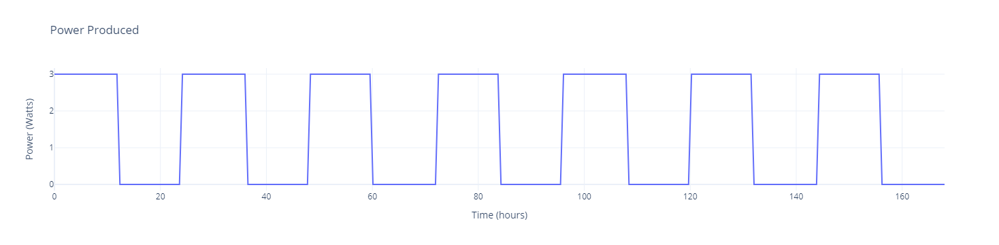

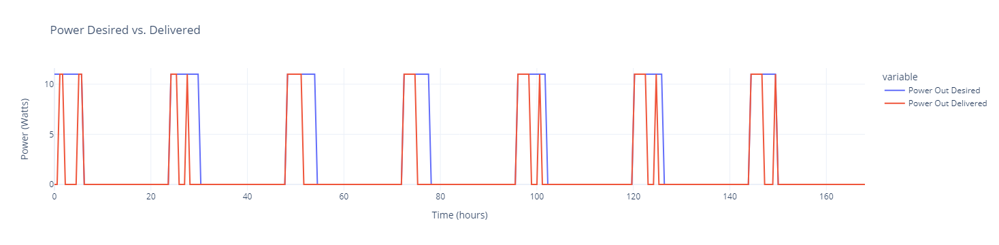

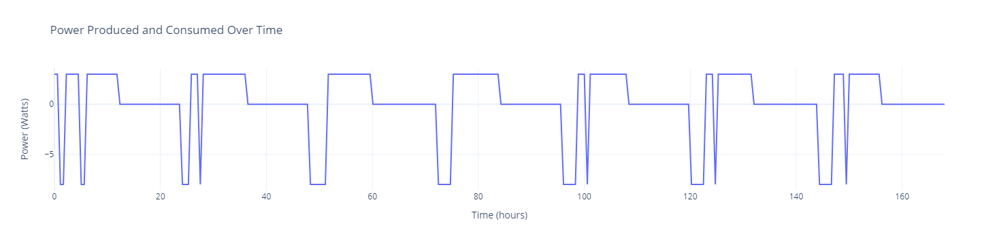

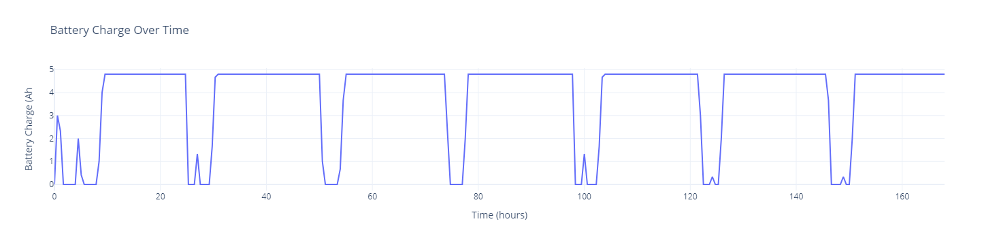

Kendall's Tau: 0.6496562413608934
P-value: 2.788587401674681e-29


# Study Configuration 2

 $$PanelCount =  2 $$

 $$BatteryCount =  3 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 2 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 3 AH $$

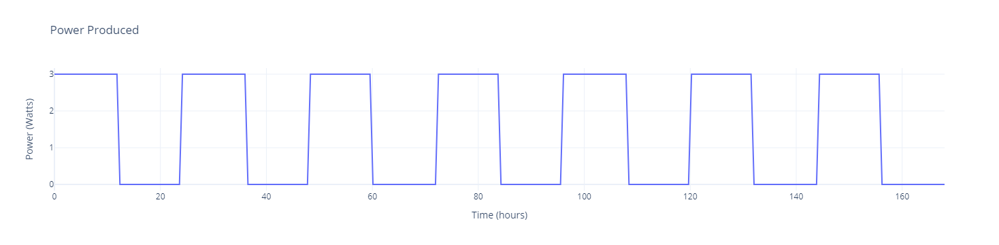

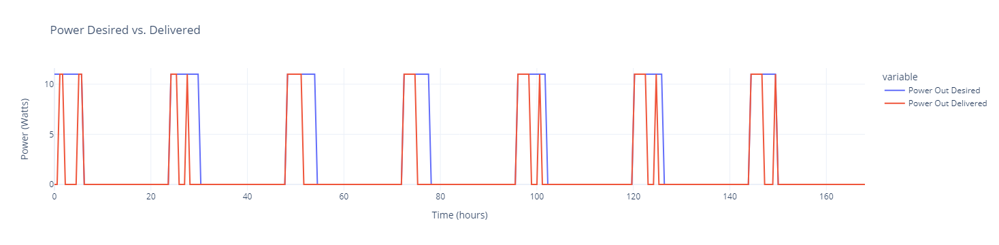

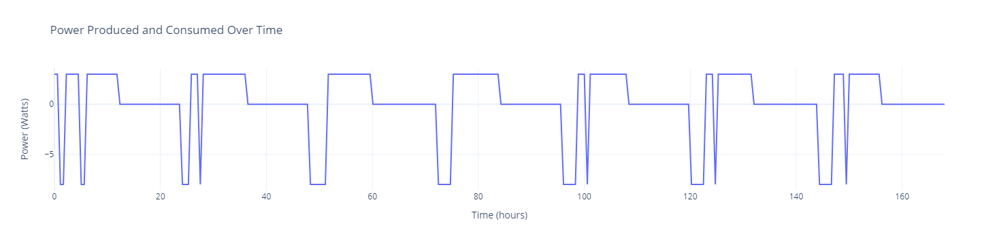

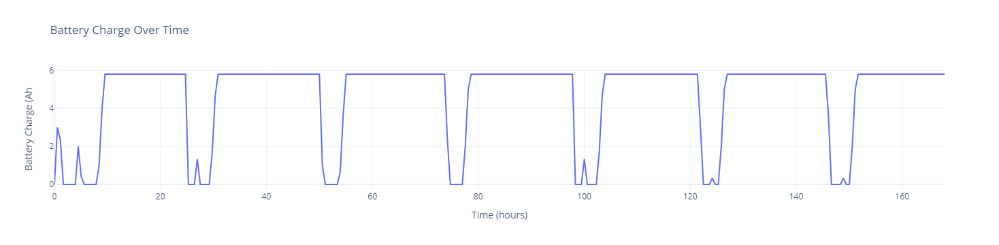

Kendall's Tau: 0.6496562413608934
P-value: 2.788587401674681e-29


# Study Configuration 3

 $$PanelCount =  2 $$

 $$BatteryCount =  4 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 2 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 4 AH $$

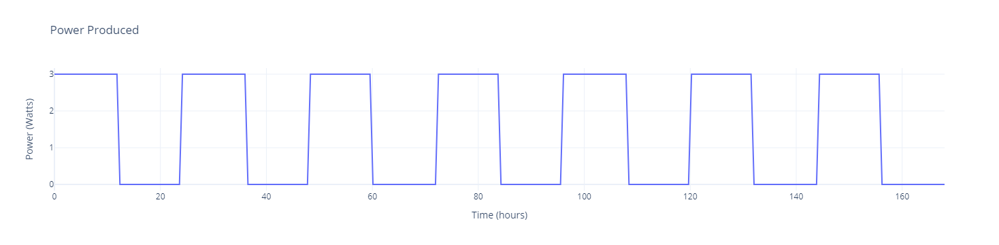

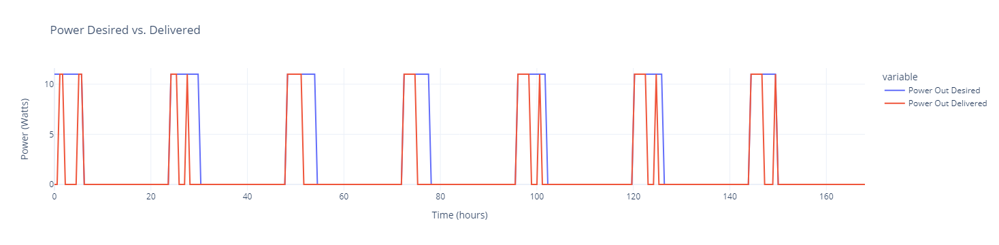

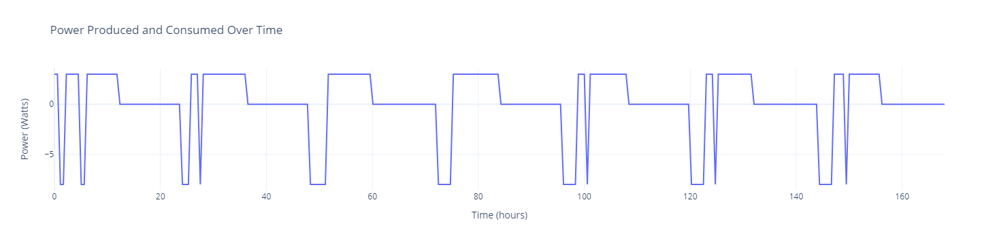

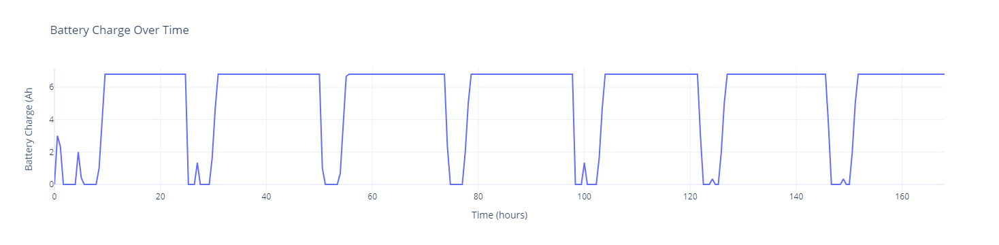

Kendall's Tau: 0.6496562413608934
P-value: 2.788587401674681e-29


# Study Configuration 4

 $$PanelCount =  3 $$

 $$BatteryCount =  2 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 3 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 2 AH $$

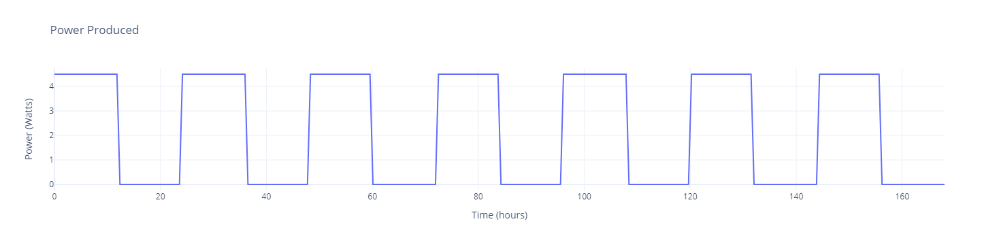

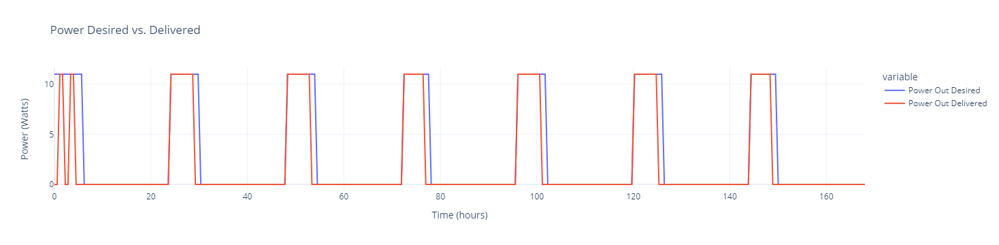

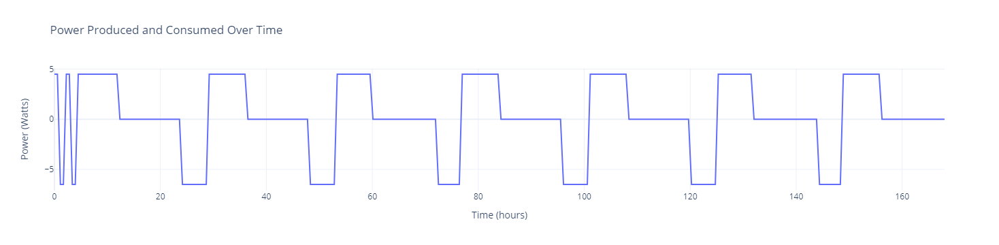

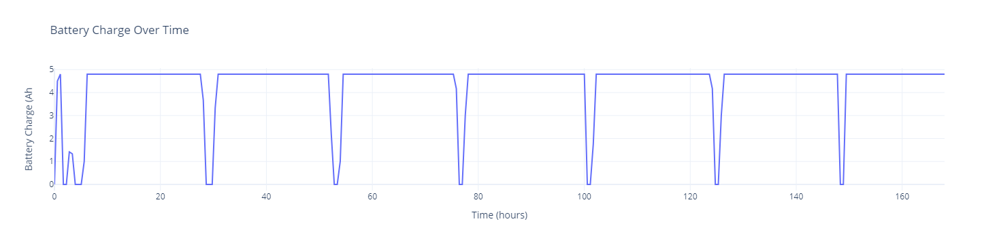

Kendall's Tau: 0.8297738186782796
P-value: 1.094477621300331e-46


# Study Configuration 5

 $$PanelCount =  3 $$

 $$BatteryCount =  3 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 3 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 3 AH $$

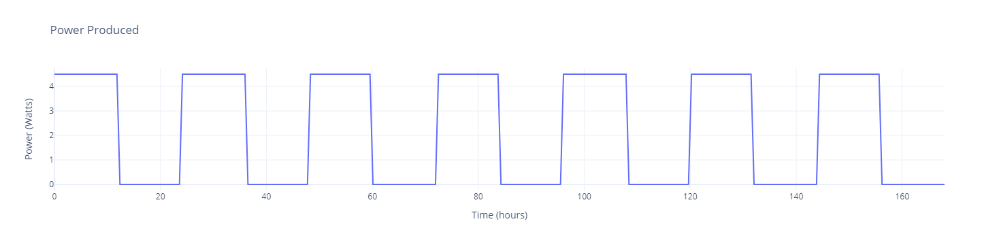

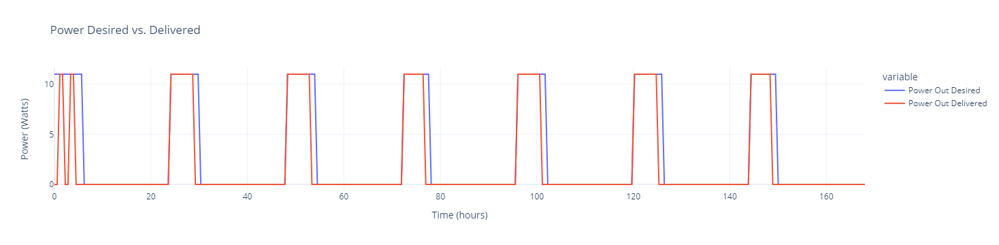

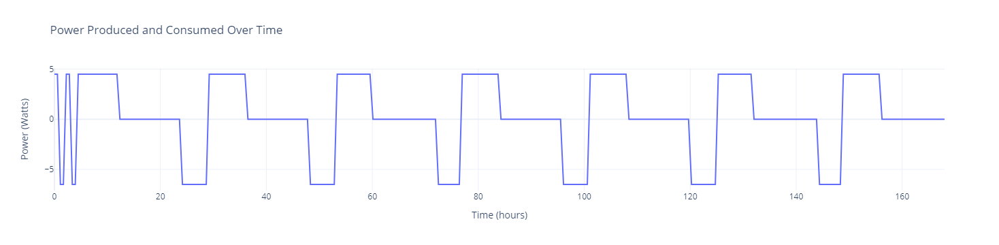

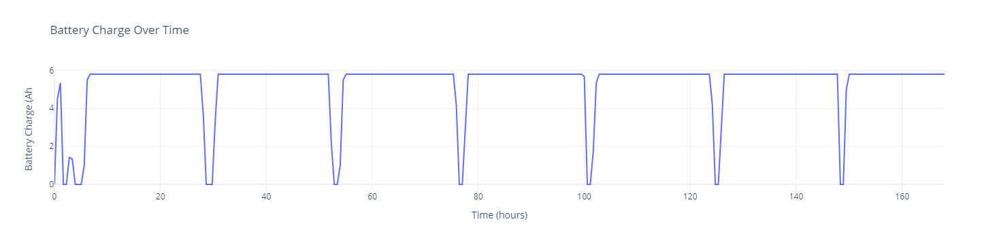

Kendall's Tau: 0.8297738186782796
P-value: 1.094477621300331e-46


# Study Configuration 6

 $$PanelCount =  3 $$

 $$BatteryCount =  4 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 3 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 4 AH $$

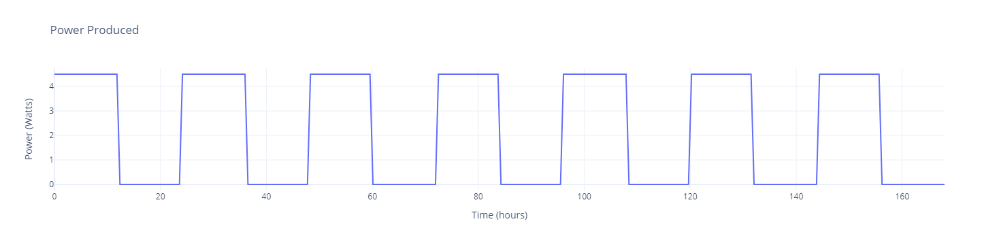

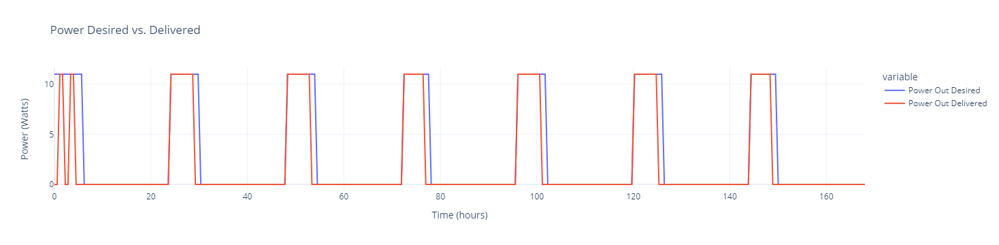

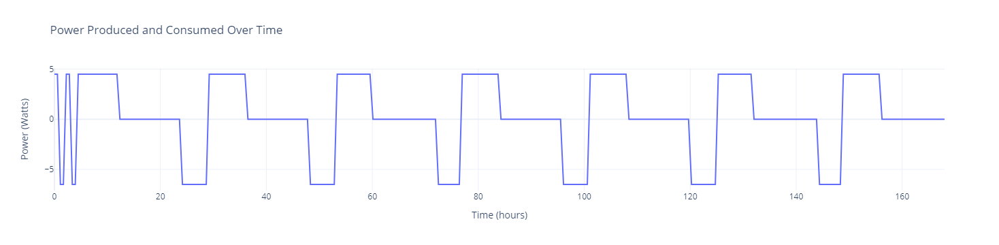

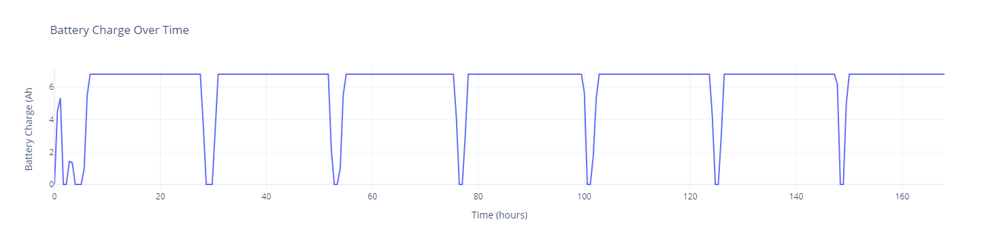

Kendall's Tau: 0.8297738186782796
P-value: 1.094477621300331e-46


# Study Configuration 7

 $$PanelCount =  4 $$

 $$BatteryCount =  2 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 4 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 2 AH $$

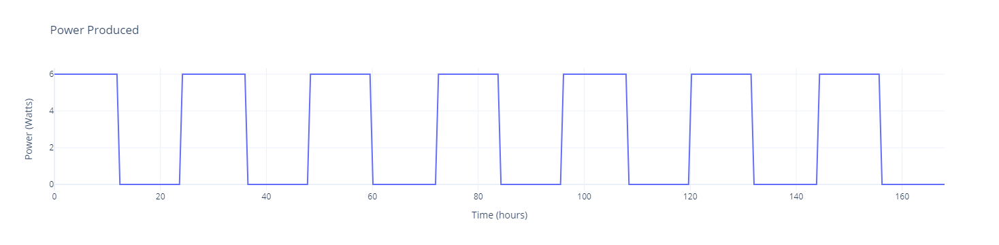

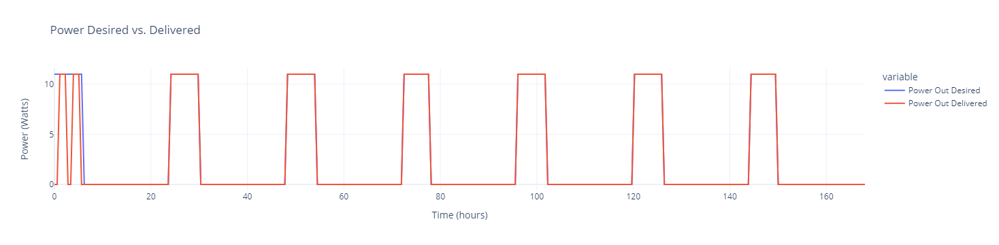

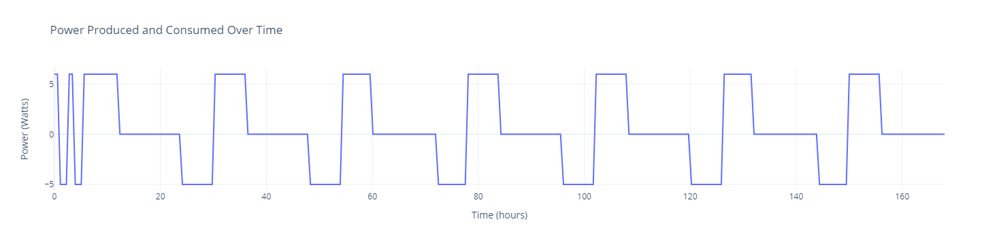

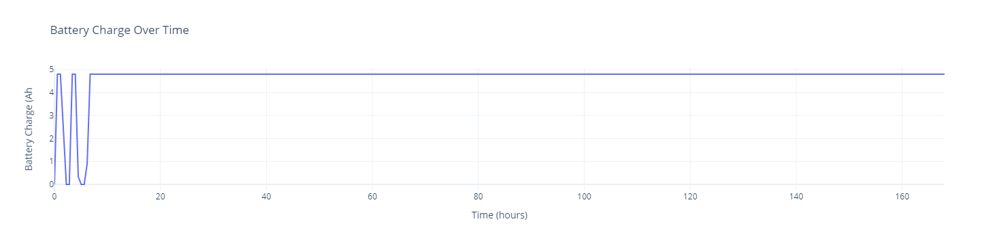

Kendall's Tau: 0.9555330859059091
P-value: 2.5181723285189077e-61


# Study Configuration 8

 $$PanelCount =  4 $$

 $$BatteryCount =  3 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 4 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 3 AH $$

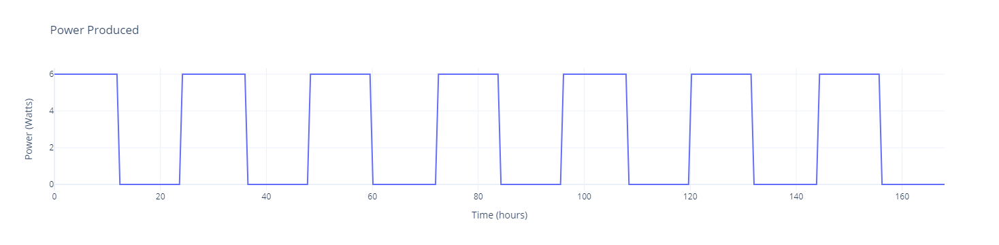

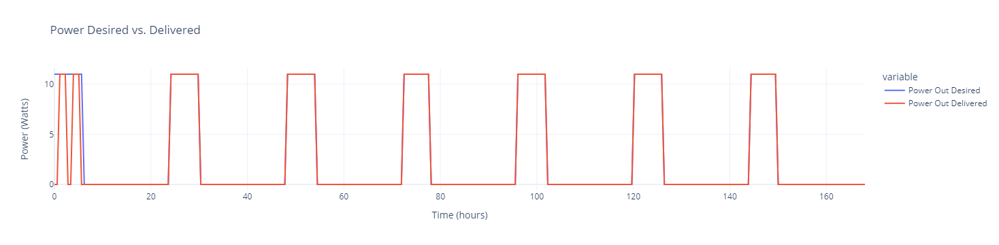

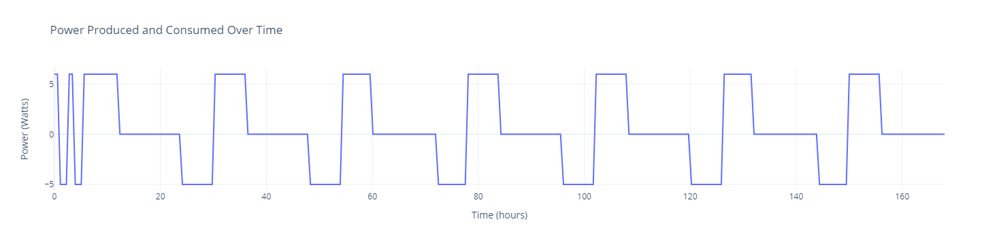

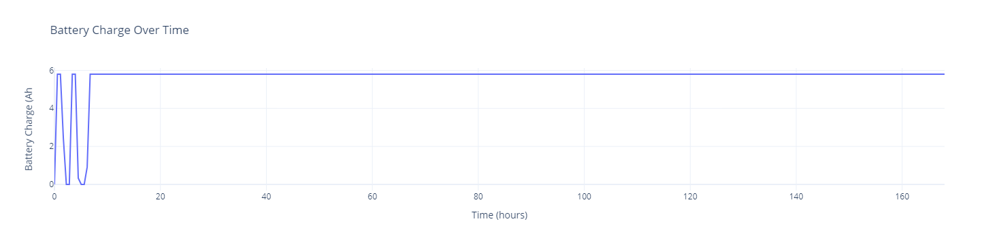

Kendall's Tau: 0.9555330859059091
P-value: 2.5181723285189077e-61


# Study Configuration 9

 This is the highest cost option. It has the hightest amount of solar panels and batterys.

 $$PanelCount =  4 $$

 $$BatteryCount =  4 $$

 $$SolarPanelPower= PanelPower * PanelCount =  2.5 * 4 $$

 $$BatteryCapacity = BatteryCapactiy * BatteryCount = 2.8 * 4 AH $$

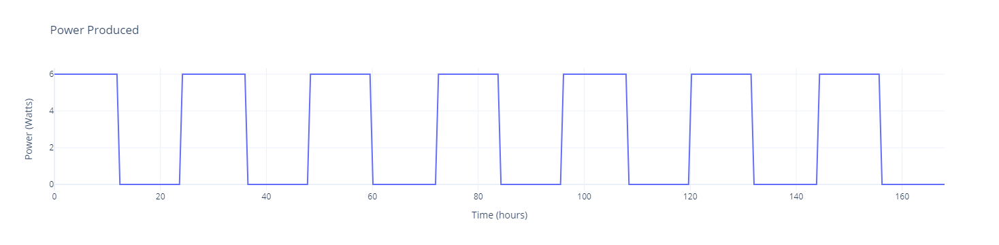

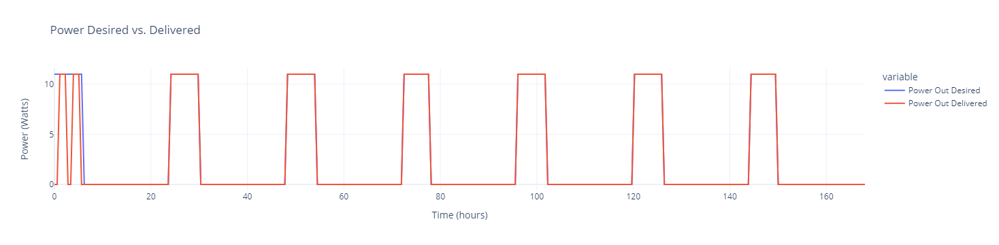

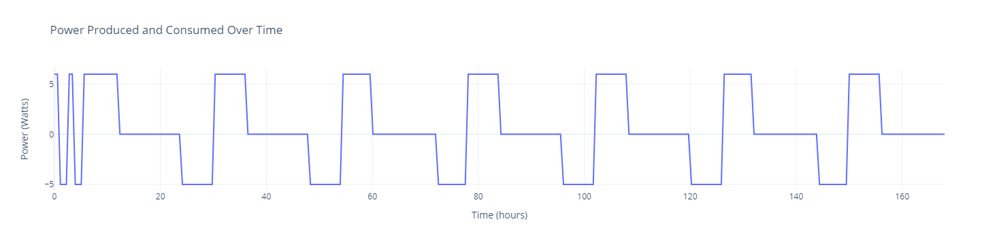

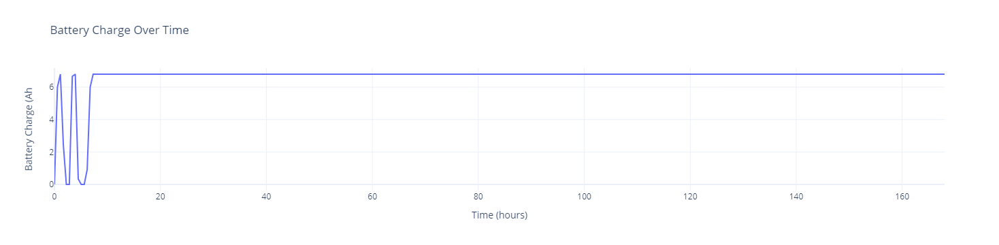

Kendall's Tau: 0.9555330859059091
P-value: 2.5181723285189077e-61


In [10]:
panel_count = solar_panel_count_min 
study = 1
while panel_count <= solar_panel_count_max :
    #print("panel_count",panel_count)
    battery_count = battery_count_min
    while battery_count <= battery_count_max:
        #print("battery_count",battery_count)
        display(Markdown(f"# Study Configuration {study}"))
        if study == 1:
            display(Markdown(f" This is low cost option. It has the least amount of solar panels and batterys."))
        if study == 9:
            display(Markdown(f" This is the highest cost option. It has the hightest amount of solar panels and batterys.")) 
        display(Markdown(f" $$PanelCount =  {panel_count} $$"))
        display(Markdown(f" $$BatteryCount =  {battery_count} $$"))
        display(Markdown(f" $$SolarPanelPower= PanelPower * PanelCount =  {panel_power} * {panel_count} $$"))
        display(Markdown(f" $$BatteryCapacity = BatteryCapactiy * BatteryCount = { battery_capacity } * {battery_count} AH $$"))

        power_in_expr = power_generator(t, sun_period_value * 24/100, 24, 7*24,  panel_power*panel_count ,charger_eff)
        power_out_expr = battery_load(t , load_period_value*  24/100,  24,  7*24  ,boost_current_limit,boost_efficiency)
        #power_expr = power_in_expr -   power_out_expr
        #print(simplify(power_expr))

        
        # Substitute period value into the expression
        power_in_func = power_in_expr.subs(period, sun_period_value)
        power_out_func = power_out_expr.subs(period, sun_period_value)
        #power_func = power_expr.subs(period, sun_period_value)

        
        
        # Generate data for plotting
        t_vals = np.linspace(0, 7*24, 300)
        total_powers = []
        battery_powers =[]
        power_in = []
        power_out_desired = []
        power_out_delivered = []
        t_val_points = []
        battery_power =0 
        for t_val in t_vals:
            power_in_eval = power_in_func.evalf(subs={t: t_val})
            power_out_eval = power_out_func.evalf(subs={t: t_val})
            

            t_val_points.append(t_val)# for simpson
            power_in.append(float(power_in_eval))
            power_out_desired.append(float(power_out_eval))
            if battery_power <= 0 :
                power_out_delivered.append(float(0.0))
                total_powers.append(float(power_in_eval )) #had to covert to python float to elimnate TypeError: float() argument must be a string or a real number, not 'generator'
            else :
                power_out_delivered.append(float(power_out_eval))
                total_powers.append(float(power_in_eval - power_out_eval)) #had to covert to python float to elimnate TypeError: float() argument must be a string or a real number, not 'generator'
            battery_power= simpson( total_powers)
            if battery_power >= battery_capacity + battery_count :
                battery_power = battery_capacity + battery_count
            if battery_power <  0  :
                battery_power = 0
            battery_powers.append(float(battery_power)) #had to covert to python float to elimnate TypeError: float() argument must be a string or a real number, not 'generator'
        #print(f"Numerical Integration Result: {battery_power}")
        #print(f"Estimated Error: {error}")
        study =  study +1

        
        df = pd.DataFrame({'Time': t_vals,'Power In': power_in,'Power Out Desired':power_out_desired,'Power Out Delivered':power_out_delivered, 'Power':total_powers,'Battery Power':battery_powers})
        #print(df)
        fig = px.line(df, x='Time', y='Power In', title='Power Produced')
        
        fig.update_layout(xaxis_title='Time (hours)',
                           yaxis_title='Power (Watts)')
        # Show the plot
        fig.show()
 
        fig = px.line(df, x='Time',  y=[ 'Power Out Desired','Power Out Delivered'], title='Power Desired vs. Delivered')
        
        fig.update_layout(xaxis_title='Time (hours)',
                           yaxis_title='Power (Watts)')
        # Show the plot
        fig.show()

        
        fig = px.line(df, x='Time', y='Power', title='Power Produced and Consumed Over Time')
        
        fig.update_layout(xaxis_title='Time (hours)',
                           yaxis_title='Power (Watts)')
        # Show the plot
        fig.show()
        
        
        fig = px.line(df, x='Time', y='Battery Power', title='Battery Charge Over Time')
        
        fig.update_layout(xaxis_title='Time (hours)',
                           yaxis_title='Battery Charge (Ah')
        # Show the plot
        fig.show()   
        correlation,p_value  = kendalltau(df['Power Out Desired'],df['Power Out Delivered'])
        print(f"Kendall's Tau: {correlation}")
        print(f"P-value: {p_value}")
        battery_count = 1 + battery_count
    panel_count = 1 + panel_count
     


## Study Summary (Manual Update by Study Reviewer) 
Study results indicates that a good solution for the maximum desired use, that 4 solar panels and at least 3 batteries will meet the deired need. 